* Methods
 1. Pretrained CNN + machine learning classifiers (Linear SVM, Kernel SVM, LR)
 2. End-to-end Finetuned CNN
 3. SIFT-BoW feature + machine learning classifiers


* Tricks
 1. Region of interest (ROI) extraction
 2. Test Time Augmentation (i.e. TTA)
 3. Data Augmentation
 4. Ensemble

# Acknowledgements

1. [OpenCV Docs ~ by OpenCV](https://docs.opencv.org/master/)
2. [OpenCV Python Tutorials ~ by OpenCV](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_tutorials.html)
3. [Plant Pathology: Very Concise TPU EfficientNet ~ by xhulu](https://www.kaggle.com/xhlulu/plant-pathology-very-concise-tpu-efficientnet)
4. [Plotly Express in Python ~ by Plotly](https://plot.ly/python/plotly-express/)
5. [EDA - Plant Pathology 2020 ~ by Peter](https://www.kaggle.com/pestipeti/eda-plant-pathology-2020)
6. [Fork of Plant 2020 TPU 915e9c ~ by Alexander](https://www.kaggle.com/ateplyuk/fork-of-plant-2020-tpu-915e9c)

# Contents

* [<font size=4>EDA</font>](#1)
    * [Preparing the ground](#1.1)
    * [Visualize one leaf](#1.2)
    * [Channel distributions](#1.3)
    * [Visualize sample leaves](#1.4)
    * [Visualize targets](#1.5)


* [<font size=4>Image processing and augmentation</font>](#2)
    * [Canny edge detection](#2.1)
    * [Flipping](#2.2)
    * [Convolution](#2.3)
    * [Blurring](#2.4)
  

* [<font size=4>Modeling</font>](#3)
    * [Preparing the ground](#3.1)
    * [DenseNet](#3.2)
    * [EfficientNet](#3.3)
    * [EfficientNet NoisyStudent](#3.4)
    * [Ensembling](#3.5)


* [<font size=4>Takeaways</font>](#4)


* [<font size=4>Ending note</font>](#5)

# Exploratory Data Analysis <a id="1"></a>

## Preparing the ground <a id="1.1"></a>

### Install and import necessary libraries

In [1]:
!pip install -q efficientnet
!pip install opencv-python==3.4.2.17
!pip install opencv-contrib-python==3.4.2.17
!conda install tensorflow-gpu -y
!conda install keras=2.3.1 -y
!conda install pandas -y
!conda install tqdm -y
!conda install scikit-learn -y
!conda install plotly -y

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.



In [2]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
import efficientnet.tfkeras as efn
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
# from kaggle_datasets import KaggleDatasets
from tensorflow.keras.applications import InceptionResNetV2

# import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

from collections import OrderedDict

# import warnings
# warnings.filterwarnings("ignore")

Using TensorFlow backend.


### Load the data and define hyperparameters

In [3]:
EPOCHS = 20
SAMPLE_LEN = 100
IMAGE_PATH = "../input/plant-pathology-2020-fgvc7/images/"
TEST_PATH = "../input/plant-pathology-2020-fgvc7/test.csv"
TRAIN_PATH = "../input/plant-pathology-2020-fgvc7/train.csv"
SUB_PATH = "../input/plant-pathology-2020-fgvc7/sample_submission.csv"

sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)

In [4]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [5]:
test_data.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


### Load sample images

In [6]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(IMAGE_PATH + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train_data["image_id"][:SAMPLE_LEN].progress_apply(load_image)

100%|██████████| 100/100 [00:01<00:00, 76.85it/s]


## Visualize one leaf <a id="1.2"></a>

### Sample image

In [7]:
fig = px.imshow(cv2.resize(train_images[0], (205, 136)))
fig.show()

I have plotted the first image in the training data above (the RGB values can be seen by hovering over the image). The green parts of the image have very low blue values, but by contrast, the brown parts have high blue values. This suggests that green (healthy) parts of the image have low blue values, whereas unhealthy parts are more likely to have high blue values. **This might suggest that the blue channel may be the key to detecting diseases in plants.**

## Channel distributions <a id="1.3"></a>

In [8]:
red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

### All channel values

In [9]:
fig = ff.create_distplot([values], group_labels=["Channels"], colors=["purple"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

The channel values seem to have a roughly normal distribution centered around 105. The maximum channel activation is 255. This means that the average channel value is less than half the maximum value, which indicates that channels are minimally activated most of the time.

### Red channel values

In [10]:
fig = ff.create_distplot([red_values], group_labels=["R"], colors=["red"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of red channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

The red channel values seem to roughly normal distribution, but with a slight rightward (positive skew). This indicates that the red channel tends to be more concentrated at lower values, at around 100. There is large variation in average red values across images.

### Green channel values

In [11]:
fig = ff.create_distplot([green_values], group_labels=["G"], colors=["green"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of green channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

The green channel values have a more uniform distribution than the red channel values, with a smaller peak. The distribution also has a leftward skew (in contrast to red) and a larger mode of around 140. This indicates that green is more pronounced in these images than red, which makes sense, because these are images of leaves!

### Blue channel values

In [12]:
fig = ff.create_distplot([blue_values], group_labels=["B"], colors=["blue"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of blue channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

The blue channel has the most uniform distribution out of the three color channels, with minimal skew (slight leftward skew). The blue channel shows great variation across images in the dataset.

### All channel values (together)

In [13]:
fig = go.Figure()

for idx, values in enumerate([red_values, green_values, blue_values]):
    if idx == 0:
        color = "Red"
    if idx == 1:
        color = "Green"
    if idx == 2:
        color = "Blue"
    fig.add_trace(go.Box(x=[color]*len(values), y=values, name=color, marker=dict(color=color.lower())))
    
fig.update_layout(yaxis_title="Mean value", xaxis_title="Color channel",
                  title="Mean value vs. Color channel", template="plotly_white")

In [14]:
fig = ff.create_distplot([red_values, green_values, blue_values],
                         group_labels=["R", "G", "B"],
                         colors=["red", "green", "blue"])
fig.update_layout(title_text="Distribution of red channel values", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[2].marker.line.color = 'rgb(0, 0, 0)'
fig.data[2].marker.line.width = 0.5
fig

From the above plots, we can clearly see which colors are more common and which ones less common in the leaf images. Green is the most pronounced color, followed by red and blue respectively. The distributions, when plotted together, appear to have a similar shape, but shifted horizontally. 

## Visualize sample leaves <a id="1.4"></a>

Now, I will visualize sample leaves beloning to different categories in the dataset.

In [15]:
def visualize_leaves(cond=[0, 0, 0, 0], cond_cols=["healthy"], is_cond=True):
    if not is_cond:
        cols, rows = 3, min([3, len(train_images)//3])
        fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
        for col in range(cols):
            for row in range(rows):
                ax[row, col].imshow(train_images.loc[train_images.index[-row*3-col-1]])
        return None
        
    cond_0 = "healthy == {}".format(cond[0])
    cond_1 = "scab == {}".format(cond[1])
    cond_2 = "rust == {}".format(cond[2])
    cond_3 = "multiple_diseases == {}".format(cond[3])
    
    cond_list = []
    for col in cond_cols:
        if col == "healthy":
            cond_list.append(cond_0)
        if col == "scab":
            cond_list.append(cond_1)
        if col == "rust":
            cond_list.append(cond_2)
        if col == "multiple_diseases":
            cond_list.append(cond_3)
    
    data = train_data[:100]
#     print(len(data))
    for cond in cond_list:
        data = data.query(cond)
        
#     print(list(data.index))    
    images = train_images.loc[list(data.index)]
    cols, rows = 3, min([3, len(images)//3])
    
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
    for col in range(cols):
        for row in range(rows):
            ax[row, col].imshow(images.loc[images.index[row*3+col]])
    plt.show()

### Healthy leaves

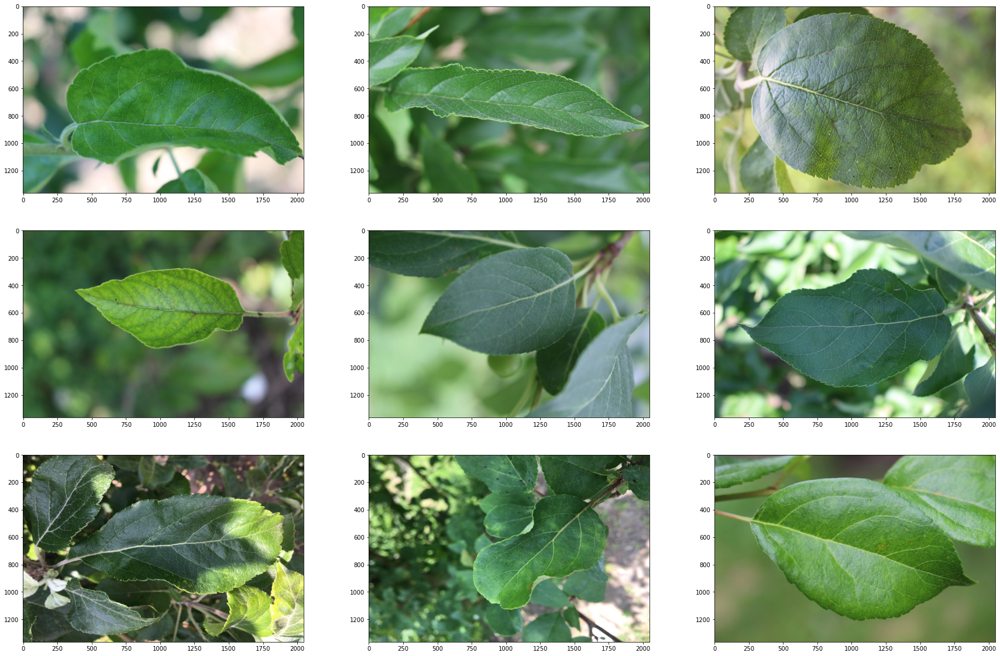

In [16]:
visualize_leaves(cond=[1, 0, 0, 0], cond_cols=["healthy"])

In the above images, we can see that the healthy leaves are completely green, do not have any brown/yellow spots or scars. Healthy leaves do not have scab or rust. 

### Leaves with scab

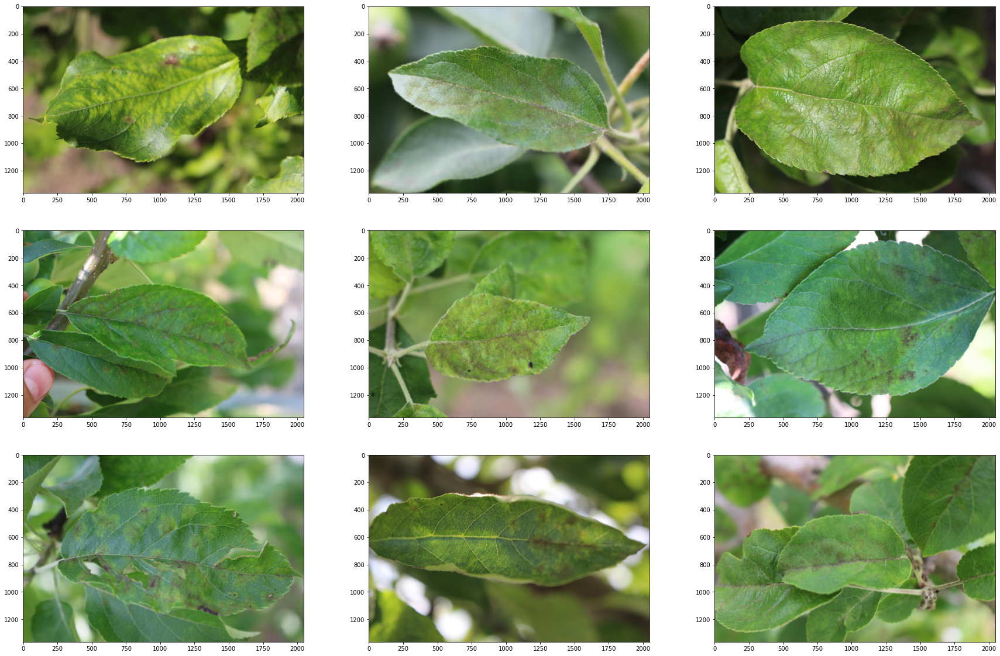

In [17]:
visualize_leaves(cond=[0, 1, 0, 0], cond_cols=["scab"])

In the above images, we can see that leaves with "scab" have large brown marks and stains across the leaf. Scab is defined as "any of various plant diseases caused by fungi or bacteria and resulting in crustlike spots on fruit, leaves, or roots. The spots caused by such a disease". The brown marks across the leaf are a sign of these bacterial/fungal infections. Once diagnosed, scab can be treated using chemical or non-chemical methods.

### Leaves with rust

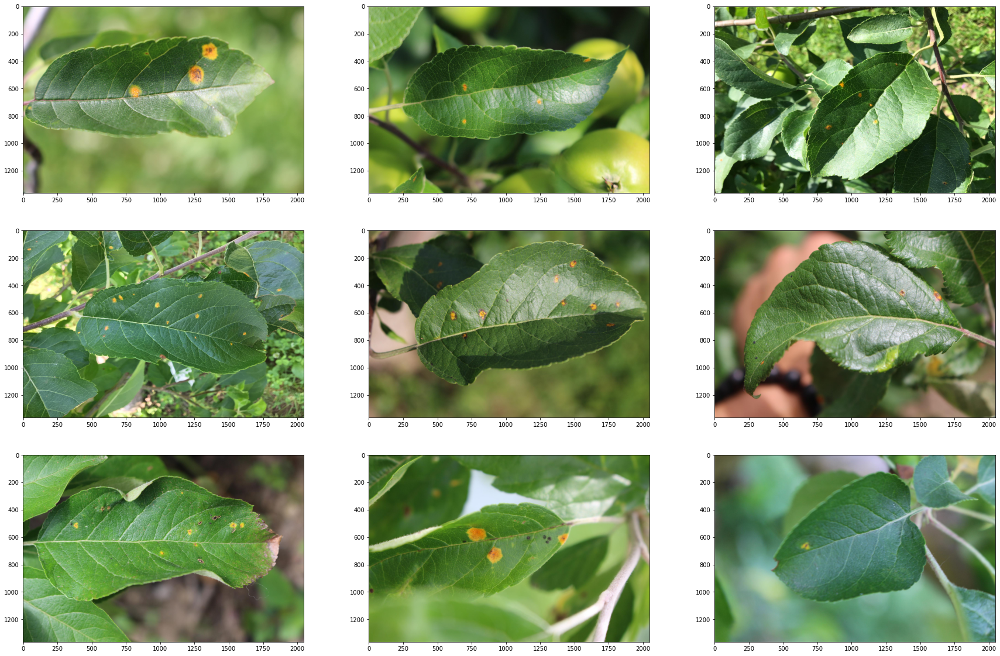

In [18]:
visualize_leaves(cond=[0, 0, 1, 0], cond_cols=["rust"])

In the above images, we can see that leaves with "rust" have several brownish-yellow spots across the leaf. Rust is defined as "a disease, especially of cereals and other grasses, characterized by rust-colored pustules of spores on the affected leaf blades and sheaths and caused by any of several rust fungi". The yellow spots are a sign of infection by a special type of fungi called "rust fungi". Rust can also be treated with several chemical and non-chemical methods once diagnosed.

### Leaves with multiple diseases

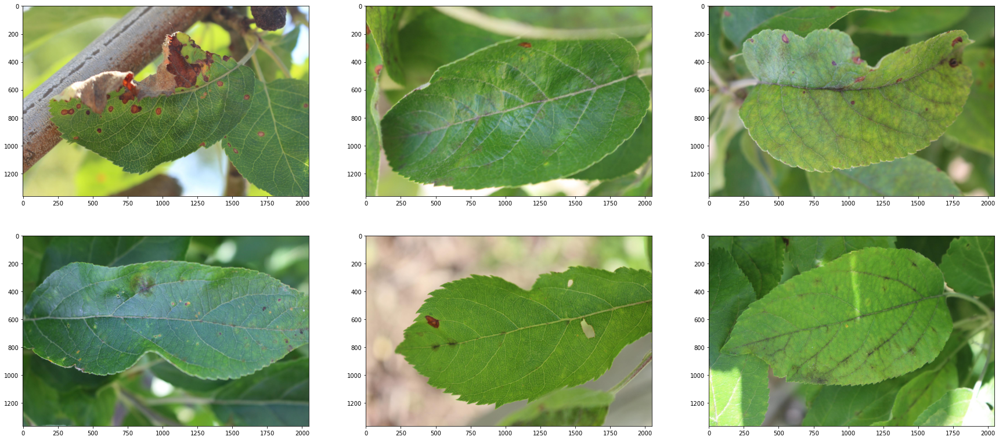

In [19]:
visualize_leaves(cond=[0, 0, 0, 1], cond_cols=["multiple_diseases"])

In the above images, we can see that the leaves show symptoms for several diseases, including brown marks and yellow spots. These plants have more than one of the above-described diseases.

## Visualize targets <a id="1.5"></a>

Now, I will visualize the labels and target data. **In all the below plots, blue represents the "desired" or "healthy" condition, and red represents the "undesired" or "unhealthy" condition.**

### Pie chart

In [20]:
fig = go.Figure([go.Pie(labels=train_data.columns[1:],
           values=train_data.iloc[:, 1:].sum().values)])
fig.update_layout(title_text="Pie chart of targets", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.show()

In the pie chart above, we can see that most leaves in the dataset are unhealthy (71.7%). Only 5% of plants have multiple diseases, and "rust" and "scab" occupy approximately one-third of the pie each.

# Prepare dataset

## hyperparameter setting and device placement

In [21]:
# TPU or GPU detection
# Detect hardware, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()
    
def seed_everything(seed=0):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'

SEED=2048
seed_everything(SEED)

print("REPLICAS: ", strategy.num_replicas_in_sync)
print("GPUs: {}".format(tf.config.experimental.list_physical_devices('GPU')))

# # Data access
# GCS_DS_PATH = KaggleDatasets().get_gcs_path()

# Configuration
AUTO = tf.data.experimental.AUTOTUNE
EPOCHS = 40
BATCH_SIZE = 16 * strategy.num_replicas_in_sync

VALIDATION_SIZE = 0.15
IMAGE_SIZE = 400

REPLICAS:  1
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## image path and labels

In [22]:
def format_path(st):
    return IMAGE_PATH + st + '.jpg'

test_paths = test_data.image_id.apply(format_path).values
trainval_paths = train_data.image_id.apply(format_path).values

trainval_labels = np.float32(train_data.loc[:, 'healthy':'scab'].values)

train_paths, valid_paths, train_labels, valid_labels =\
train_test_split(trainval_paths, trainval_labels, test_size=VALIDATION_SIZE,
                 random_state=SEED)

print('train samples: ', len(train_paths))
print('valid samples: ', len(valid_paths))
print('test samples: ', len(test_paths))
print('path example: ', train_paths[0])
print('label example: ',  train_labels[0])

train samples:  1547
valid samples:  274
test samples:  1821
path example:  ../input/plant-pathology-2020-fgvc7/images/Train_96.jpg
label example:  [0. 0. 1. 0.]


## helper functions to load image

In [23]:
def decode_image(filename, label=None, image_size=(IMAGE_SIZE, IMAGE_SIZE)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
#     image = tf.cast(image, tf.float32) / 255.0
# https://www.tensorflow.org/tutorials/images/transfer_learning
# https://github.com/keras-team/keras-applications/blob/bc89834ed36935ab4a4994446e34ff81c0d8e1b7/keras_applications/imagenet_utils.py#L42
    image = tf.cast(image, tf.float32)
    image = (image/127.5) - 1
    image = tf.image.resize(image, image_size)
    
    if label is None:
        return image
    else:
        return image, label

def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

## helper function to display metrics

In [24]:
def display_training_curves(training, validation, title, subplot):
    """
    Source: https://www.kaggle.com/mgornergoogle/getting-started-with-100-flowers-on-tpu
    """
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

## create dataset object

In [25]:
trainval_dataset = (
    tf.data.Dataset
    .from_tensor_slices((trainval_paths, trainval_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .cache()
    .map(data_augment, num_parallel_calls=AUTO)
    .shuffle(512)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

train_dataset = (
tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .cache()
    .map(data_augment, num_parallel_calls=AUTO)
    .repeat()
    .shuffle(512)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

train_dataset_1 = (
tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .cache()
    .map(data_augment, num_parallel_calls=AUTO)
    .repeat()
    .shuffle(512)
    .batch(64)
    .prefetch(AUTO)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((valid_paths, valid_labels))
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .cache()
    .prefetch(AUTO)
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=AUTO)
    .map(data_augment, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
)

## helper function to get backbone

In [27]:
def get_backbone(cnn='VGG16'):
    assert cnn in ['ResNet101V2', 'VGG16', 'InceptionResNetV2', 'MobileNetV2']
    if cnn == 'ResNet101V2':
        backbone = tf.keras.applications.ResNet101V2(
            input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
            weights='imagenet',
            include_top=False)
    if cnn == 'VGG16':
        backbone = tf.keras.applications.VGG16(
            input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
            weights='imagenet',
            include_top=False)
    if cnn == 'InceptionResNetV2':
        backbone = tf.keras.applications.InceptionResNetV2(
            input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
            weights='imagenet',
            include_top=False)
    if cnn == 'MobileNetV2':
        backbone = tf.keras.applications.MobileNetV2(
            input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
            weights='imagenet',
            include_top=False)     
    return backbone
        

## outpt directories 

In [28]:
ckpt_dir = '../output/best_models'
submission_dir = '../output/submissions'
os.makedirs(ckpt_dir, exist_ok=True)
os.makedirs(submission_dir, exist_ok=True)

# Classifiers

## End-to-end finetuned CNN

CNNs to be finetuned:

* ResNet101V2
* VGG16
* InceptionResNetV2
* MobileNetV2

All available pretrained CNNs are here: [Module: tf.keras.applications](https://www.tensorflow.org/api_docs/python/tf/keras/applications)

### learning rate scheduler

Learning rate schedule: 0.0001 to 0.0004 to 0.0001


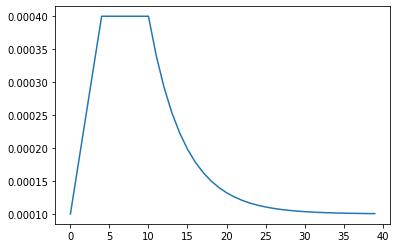

In [29]:
LR_START = 0.0001
LR_MAX = 0.00005 * 8
LR_MIN = 0.0001
LR_RAMPUP_EPOCHS = 4
LR_SUSTAIN_EPOCHS = 6
LR_EXP_DECAY = .8

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN
    return lr
    
lr_callback = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

### finetune models

Finitune ResNet101V2...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet101v2 (Model)          (None, 13, 13, 2048)      42626560  
_________________________________________________________________
global_max_pooling2d (Global (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 4)                 8196      
Total params: 42,634,756
Trainable params: 42,537,092
Non-trainable params: 97,664
_________________________________________________________________
Train for 96 steps, validate for 18 steps

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0001.
Epoch 1/40
95/96 [============================>.] - ETA: 0s - loss: 2.4365 - categorical_accuracy: 0.7053
Epoch 00001: val_categorical_accuracy improved from -inf to 0.79927, saving model to ../output/best_models/finetuned_ResNet101V


Epoch 00018: LearningRateScheduler reducing learning rate to 0.00016291456000000005.
Epoch 18/40
95/96 [============================>.] - ETA: 0s - loss: 0.0318 - categorical_accuracy: 0.9947
Epoch 00018: val_categorical_accuracy did not improve from 0.95985
96/96 [==============================] - 37s 384ms/step - loss: 0.0315 - categorical_accuracy: 0.9948 - val_loss: 0.2251 - val_categorical_accuracy: 0.9270

Epoch 00019: LearningRateScheduler reducing learning rate to 0.00015033164800000003.
Epoch 19/40
95/96 [============================>.] - ETA: 0s - loss: 0.0252 - categorical_accuracy: 0.9961
Epoch 00019: val_categorical_accuracy did not improve from 0.95985
96/96 [==============================] - 37s 384ms/step - loss: 0.0249 - categorical_accuracy: 0.9961 - val_loss: 0.1904 - val_categorical_accuracy: 0.9489

Epoch 00020: LearningRateScheduler reducing learning rate to 0.00014026531840000004.
Epoch 20/40
95/96 [============================>.] - ETA: 0s - loss: 0.0109 - cate


Epoch 00038: LearningRateScheduler reducing learning rate to 0.00010072535549176879.
Epoch 38/40
95/96 [============================>.] - ETA: 0s - loss: 0.0250 - categorical_accuracy: 0.9908
Epoch 00038: val_categorical_accuracy did not improve from 0.96715
96/96 [==============================] - 37s 384ms/step - loss: 0.0247 - categorical_accuracy: 0.9909 - val_loss: 0.1450 - val_categorical_accuracy: 0.9526

Epoch 00039: LearningRateScheduler reducing learning rate to 0.00010058028439341503.
Epoch 39/40
95/96 [============================>.] - ETA: 0s - loss: 0.0020 - categorical_accuracy: 0.9993
Epoch 00039: val_categorical_accuracy did not improve from 0.96715
96/96 [==============================] - 37s 384ms/step - loss: 0.0020 - categorical_accuracy: 0.9993 - val_loss: 0.1580 - val_categorical_accuracy: 0.9599

Epoch 00040: LearningRateScheduler reducing learning rate to 0.00010046422751473202.
Epoch 40/40
95/96 [============================>.] - ETA: 0s - loss: 0.0045 - cate

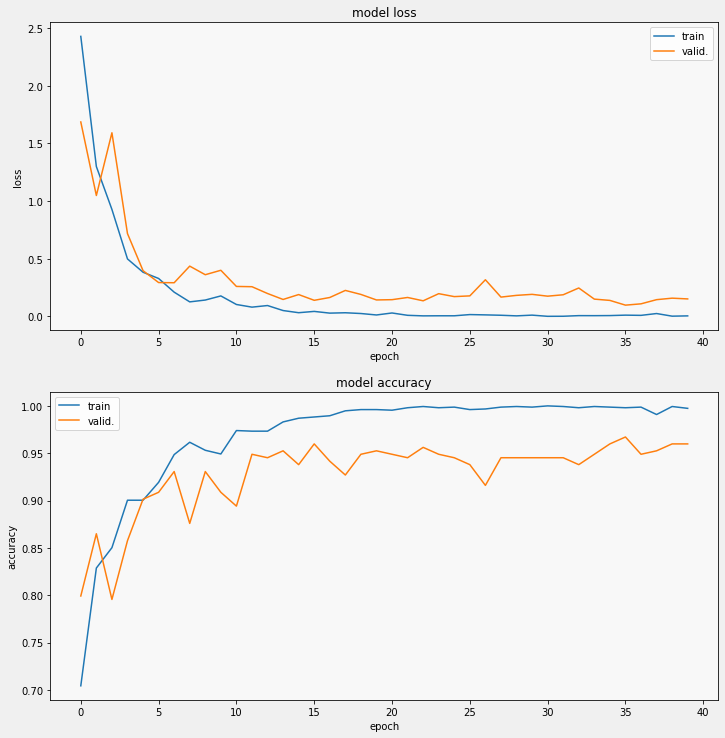

record:  0.09753319435577623 0.9671533
Start inference on test dataset.
114/114 [==============================] - 15s 135ms/step
Finitune VGG16...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 12, 12, 512)       14714688  
_________________________________________________________________
global_max_pooling2d (Global (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 4)                 2052      
Total params: 14,716,740
Trainable params: 14,716,740
Non-trainable params: 0
_________________________________________________________________
Train for 96 steps, validate for 18 steps

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0001.
Epoch 1/40
95/96 [============================>.] - ETA: 0s - loss: 1.2626 - categorical_accuracy: 0.3822
Epoch 00


Epoch 00018: LearningRateScheduler reducing learning rate to 0.00016291456000000005.
Epoch 18/40
95/96 [============================>.] - ETA: 0s - loss: 0.2320 - categorical_accuracy: 0.9184
Epoch 00018: val_categorical_accuracy did not improve from 0.90876
96/96 [==============================] - 47s 494ms/step - loss: 0.2305 - categorical_accuracy: 0.9193 - val_loss: 0.2777 - val_categorical_accuracy: 0.8942

Epoch 00019: LearningRateScheduler reducing learning rate to 0.00015033164800000003.
Epoch 19/40
95/96 [============================>.] - ETA: 0s - loss: 0.2000 - categorical_accuracy: 0.9309
Epoch 00019: val_categorical_accuracy improved from 0.90876 to 0.92336, saving model to ../output/best_models/finetuned_VGG16.h5
96/96 [==============================] - 48s 499ms/step - loss: 0.2000 - categorical_accuracy: 0.9310 - val_loss: 0.2300 - val_categorical_accuracy: 0.9234

Epoch 00020: LearningRateScheduler reducing learning rate to 0.00014026531840000004.
Epoch 20/40
95/96 [=


Epoch 00038: LearningRateScheduler reducing learning rate to 0.00010072535549176879.
Epoch 38/40
95/96 [============================>.] - ETA: 0s - loss: 0.0788 - categorical_accuracy: 0.9783
Epoch 00038: val_categorical_accuracy did not improve from 0.92336
96/96 [==============================] - 47s 494ms/step - loss: 0.0782 - categorical_accuracy: 0.9785 - val_loss: 0.2256 - val_categorical_accuracy: 0.9015

Epoch 00039: LearningRateScheduler reducing learning rate to 0.00010058028439341503.
Epoch 39/40
95/96 [============================>.] - ETA: 0s - loss: 0.0649 - categorical_accuracy: 0.9776
Epoch 00039: val_categorical_accuracy did not improve from 0.92336
96/96 [==============================] - 47s 494ms/step - loss: 0.0643 - categorical_accuracy: 0.9779 - val_loss: 0.3333 - val_categorical_accuracy: 0.8978

Epoch 00040: LearningRateScheduler reducing learning rate to 0.00010046422751473202.
Epoch 40/40
95/96 [============================>.] - ETA: 0s - loss: 0.0566 - cate

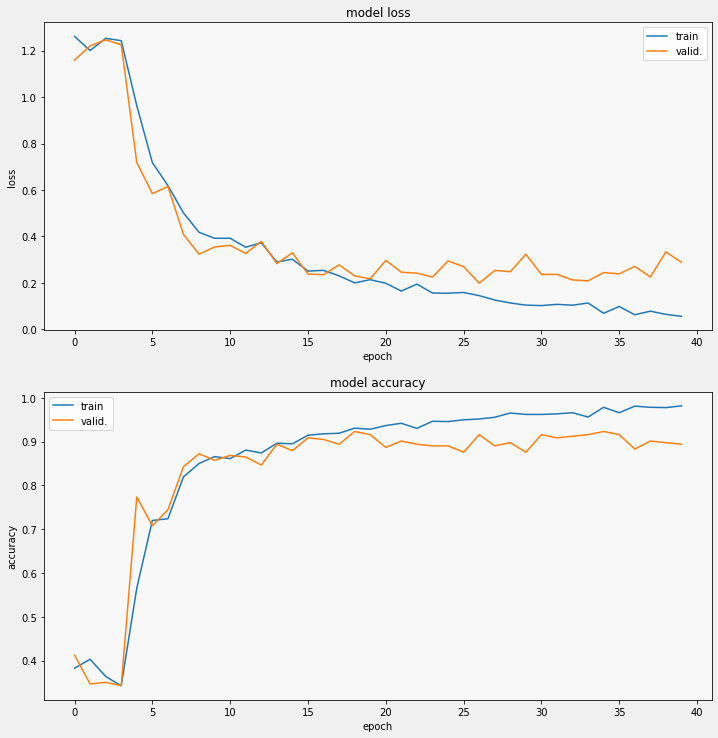

record:  0.2299857801861233 0.92335767
Start inference on test dataset.
114/114 [==============================] - 18s 156ms/step
Finitune InceptionResNetV2...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 11, 11, 1536)      54336736  
_________________________________________________________________
global_max_pooling2d (Global (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 4)                 6148      
Total params: 54,342,884
Trainable params: 54,282,340
Non-trainable params: 60,544
_________________________________________________________________
Train for 96 steps, validate for 18 steps

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0001.
Epoch 1/40
95/96 [============================>.] - ETA: 0s - loss: 0.7320 - categorical_accuracy


Epoch 00018: LearningRateScheduler reducing learning rate to 0.00016291456000000005.
Epoch 18/40
95/96 [============================>.] - ETA: 0s - loss: 0.0077 - categorical_accuracy: 0.9980
Epoch 00018: val_categorical_accuracy did not improve from 0.96350
96/96 [==============================] - 43s 448ms/step - loss: 0.0076 - categorical_accuracy: 0.9980 - val_loss: 0.1707 - val_categorical_accuracy: 0.9526

Epoch 00019: LearningRateScheduler reducing learning rate to 0.00015033164800000003.
Epoch 19/40
95/96 [============================>.] - ETA: 0s - loss: 0.0356 - categorical_accuracy: 0.9947
Epoch 00019: val_categorical_accuracy did not improve from 0.96350
96/96 [==============================] - 43s 450ms/step - loss: 0.0352 - categorical_accuracy: 0.9948 - val_loss: 0.1953 - val_categorical_accuracy: 0.9416

Epoch 00020: LearningRateScheduler reducing learning rate to 0.00014026531840000004.
Epoch 20/40
95/96 [============================>.] - ETA: 0s - loss: 0.0099 - cate


Epoch 00038: LearningRateScheduler reducing learning rate to 0.00010072535549176879.
Epoch 38/40
95/96 [============================>.] - ETA: 0s - loss: 0.0046 - categorical_accuracy: 0.9993
Epoch 00038: val_categorical_accuracy did not improve from 0.96350
96/96 [==============================] - 43s 448ms/step - loss: 0.0045 - categorical_accuracy: 0.9993 - val_loss: 0.1666 - val_categorical_accuracy: 0.9526

Epoch 00039: LearningRateScheduler reducing learning rate to 0.00010058028439341503.
Epoch 39/40
95/96 [============================>.] - ETA: 0s - loss: 3.1130e-04 - categorical_accuracy: 1.0000
Epoch 00039: val_categorical_accuracy did not improve from 0.96350
96/96 [==============================] - 43s 448ms/step - loss: 3.0897e-04 - categorical_accuracy: 1.0000 - val_loss: 0.1734 - val_categorical_accuracy: 0.9599

Epoch 00040: LearningRateScheduler reducing learning rate to 0.00010046422751473202.
Epoch 40/40
95/96 [============================>.] - ETA: 0s - loss: 0.002

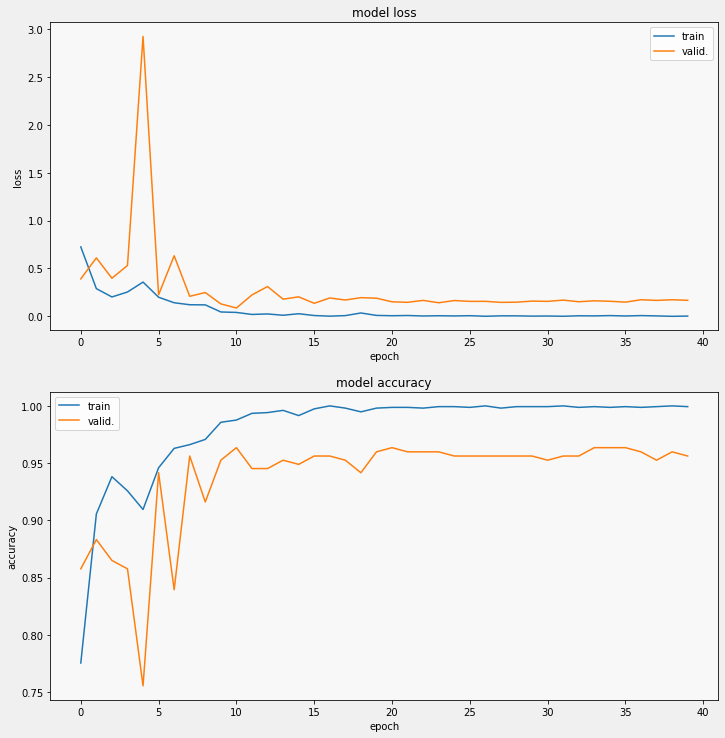

record:  0.08708355718732087 0.96350366
Start inference on test dataset.
114/114 [==============================] - 18s 156ms/step
Finitune MobileNetV2...


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 13, 13, 1280)      2257984   
_________________________________________________________________
global_max_pooling2d (Global (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 4)                 5124      
Total params: 2,263,108
Trainable params: 2,228,996
Non-trainable params: 34,112
_________________________________________________________________
Train for 96 steps, validate for 18 steps

Epoch 00001: LearningRateScheduler reducing learning rate to 0.0001.
Epoch 1/40
95/96 [============================>.] - ETA: 0s - loss: 1.6417 - categorical_accuracy: 0.6309
Epoch 00001: val_categorical_accuracy improved from -inf to 0.47810, saving model to ../output/best_models/finetuned_MobileNetV2.h5
96/96 [==============


Epoch 00018: LearningRateScheduler reducing learning rate to 0.00016291456000000005.
Epoch 18/40
95/96 [============================>.] - ETA: 0s - loss: 0.0524 - categorical_accuracy: 0.9875
Epoch 00018: val_categorical_accuracy improved from 0.82482 to 0.84307, saving model to ../output/best_models/finetuned_MobileNetV2.h5
96/96 [==============================] - 19s 198ms/step - loss: 0.0564 - categorical_accuracy: 0.9863 - val_loss: 0.5485 - val_categorical_accuracy: 0.8431

Epoch 00019: LearningRateScheduler reducing learning rate to 0.00015033164800000003.
Epoch 19/40
95/96 [============================>.] - ETA: 0s - loss: 0.0441 - categorical_accuracy: 0.9875
Epoch 00019: val_categorical_accuracy did not improve from 0.84307
96/96 [==============================] - 19s 195ms/step - loss: 0.0437 - categorical_accuracy: 0.9876 - val_loss: 0.5435 - val_categorical_accuracy: 0.8248

Epoch 00020: LearningRateScheduler reducing learning rate to 0.00014026531840000004.
Epoch 20/40
95


Epoch 00037: LearningRateScheduler reducing learning rate to 0.00010090669436471098.
Epoch 37/40
95/96 [============================>.] - ETA: 0s - loss: 0.0147 - categorical_accuracy: 0.9947
Epoch 00037: val_categorical_accuracy improved from 0.96350 to 0.97080, saving model to ../output/best_models/finetuned_MobileNetV2.h5
96/96 [==============================] - 19s 198ms/step - loss: 0.0146 - categorical_accuracy: 0.9948 - val_loss: 0.2247 - val_categorical_accuracy: 0.9708

Epoch 00038: LearningRateScheduler reducing learning rate to 0.00010072535549176879.
Epoch 38/40
95/96 [============================>.] - ETA: 0s - loss: 0.0094 - categorical_accuracy: 0.9961
Epoch 00038: val_categorical_accuracy did not improve from 0.97080
96/96 [==============================] - 19s 195ms/step - loss: 0.0093 - categorical_accuracy: 0.9961 - val_loss: 0.2387 - val_categorical_accuracy: 0.9635

Epoch 00039: LearningRateScheduler reducing learning rate to 0.00010058028439341503.
Epoch 39/40
95

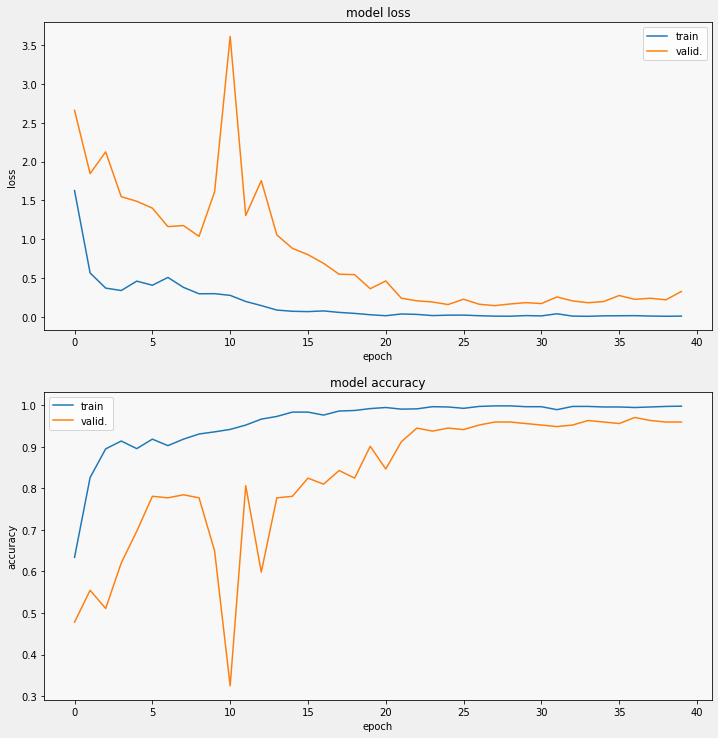

record:  0.2246605026032032 0.9708029
Start inference on test dataset.
114/114 [==============================] - 15s 128ms/step


In [30]:
record_ls = []

for cnn in ['ResNet101V2', 'VGG16', 'InceptionResNetV2', 'MobileNetV2']:
    print(f'Finitune {cnn}...')
    record = OrderedDict()
    
    with strategy.scope():
#         model = get_model(cnn)
        backbone = get_backbone(cnn)
        model =  tf.keras.Sequential([
            backbone,
            L.GlobalMaxPooling2D(),
#             L.Dropout(0.3),
            L.Dense(4, activation='softmax')
            ])
        model.compile(
            optimizer = 'adam',
            loss = 'categorical_crossentropy',
            metrics=['categorical_accuracy']
            )
        model.summary()
        
        
        ckpt_path = os.path.join(ckpt_dir,
                                 f'finetuned_{cnn}.h5')
        checkpoint = tf.keras.callbacks.ModelCheckpoint(
            ckpt_path,
            verbose=1,
            monitor='val_categorical_accuracy',
            save_best_only=True,
            mode='auto') 

        STEPS_PER_EPOCH = train_labels.shape[0] // BATCH_SIZE
        history = model.fit(
            train_dataset, 
            epochs=EPOCHS, 
            callbacks=[lr_callback, checkpoint],
            steps_per_epoch=STEPS_PER_EPOCH,
            validation_data=valid_dataset
            )
        
        display_training_curves(
            history.history['loss'], 
            history.history['val_loss'], 
            'loss', 211)
        display_training_curves(
            history.history['categorical_accuracy'], 
            history.history['val_categorical_accuracy'], 
            'accuracy', 212)
        plt.show()
        
        record['model'] = f'finetuned_{cnn}'
        best_idx = np.argmax(history.history['val_categorical_accuracy'])
        record['train_loss'] = history.history['loss'][best_idx]
        record['valid_loss'] = history.history['val_loss'][best_idx]
        record['train_acc'] = history.history['categorical_accuracy'][best_idx]
        record['valid_acc'] = history.history['val_categorical_accuracy'][best_idx]
        record_ls.append(record)
        
        model.load_weights(ckpt_path)
        
        print('record: ', record['valid_loss'], record['valid_acc'])
#         val_loss, val_acc = model.evaluate(valid_dataset)
#         print('confirmation: ', val_loss, val_acc)
        
        print('Start inference on test dataset.')
        probs = model.predict(test_dataset, verbose=1)
        sub.loc[:, 'healthy':] = probs
        sub.to_csv(os.path.join(submission_dir, f'finetune_{cnn}.csv'), index=False)
#         sub.head()
    
    # release memory
    # https://forums.fast.ai/t/how-could-i-release-gpu-memory-of-keras/2023/19
    del model
    K.clear_session()
    gc.collect()

In [31]:
report_df =  pd.DataFrame(record_ls)

with pd.option_context('display.max_rows', None, 'display.max_columns', None): 
    display(report_df)

,model,train_loss,valid_loss,train_acc,valid_acc
0,finetuned_ResNet101V2,0.010821,0.097533,0.998047,0.967153
1,finetuned_VGG16,0.199969,0.229986,0.930990,0.923358
2,finetuned_InceptionResNetV2,0.040917,0.087084,0.987630,0.963504
3,finetuned_MobileNetV2,0.014561,0.224661,0.994792,0.970803


In [32]:
report_df.to_csv(os.path.join('../output', f'fintune_cnn_report.csv'), index=False)

## Pretrained CNN feature + machine learning classifiers

* Pretrained CNN: MobileNetV2, InceptionResNetV2, VGG16
* Machine learning classifiers: linearSVM, rbfSVM, LR
* Dimension reduction: NFM, rbfKPCA

In [13]:
from sklearn.decomposition import PCA, KernelPCA, TruncatedSVD, NMF
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, ParameterGrid
from sklearn.preprocessing import Normalizer, StandardScaler
from joblib import parallel_backend

In [20]:
def get_classifier(name='linearSVM'):
    if name == 'linearSVM':
#         return LinearSVC(class_weight='balanced',
#                              probability=True)
        return SVC(kernel='linear',
                   class_weight='balanced',
                   probability=True)
    if name == 'rbfSVM':
        return SVC(kernel='rbf',
                       class_weight='balanced',
                       probability=True)
    if name == 'LR':
        return LogisticRegression()
    
def get_dim_reductor(name='PCA_128'):
    method, n_components = name.split('_')
    n_components = int(n_components)
#     print(method, n_components)
    if method == 'PCA':
        return PCA(n_components=n_components)
#         return KernelPCA(n_components=n_components)
    
    if method == 'KPCA':
        return KernelPCA(kernel='rbf', n_components=n_components)
    
    if method == 'LSA':
        return TruncatedSVD(n_components=n_components,
                            random_state=SEED)
    
    if method == 'NMF':
        return NMF(n_components=n_components)

In [22]:
# a strange bug: when I use N_JOBS=-1, the fitting stucks
N_JOBS=-1

class HybridClassfier(object):
    def __init__(self, cnn='VGG16', classifier='linearSVM', dim_reductor='PCA_128', cache_dir='feature_cache'):
        
#         self.cache_dir = cachedir
#         os.makedir(self.cache_dir, exist_ok=True)
        backbone = get_backbone(cnn)
        self.feature =  tf.keras.Sequential([
            backbone,
            L.GlobalMaxPooling2D()
        ])
    
        if dim_reductor != 'none':
            dim_red = get_dim_reductor(dim_reductor)
            classifier = get_classifier(classifier)
            pipe = Pipeline(steps=[('dimred', dim_red),
#                                    ('normalizer', Normalizer()),
                                   ('cls', classifier)])
            param_grid = {'cls__C': np.logspace(-3, 3, 13)}
            self.classifier = GridSearchCV(pipe,
                                           param_grid,
                                           scoring='accuracy',
                                           n_jobs=N_JOBS,
                                           verbose=True)
        
        else:
            classifier = get_classifier(classifier)
            pipe = Pipeline(steps=[('scaler', StandardScaler()),
                                   ('cls', classifier)])
            param_grid =  {'cls__C': np.logspace(-3,3,13)}
            self.classifier = GridSearchCV(pipe,
                                           param_grid, 
                                           scoring='accuracy',
                                           n_jobs=N_JOBS,
                                           verbose=True)
        
    def fit(self, train_data):
        Xf = []
        Y = []
        print('extracting feature...')
        for image_batch, label_batch in train_data:
#             print(self.feature(image_batch).shape)
            Xf.append(self.feature(image_batch)) 
            Y.append(label_batch.numpy())
#         print(len(Xf))
        Xf = np.concatenate(Xf, 0)
        Y = np.argmax(np.concatenate(Y, 0), 1)
#         print(Xf.shape)
#         print(Xf[:5])
#         print(Y[:5])
        with parallel_backend('loky'):
            self.classifier.fit(Xf, Y)
        return self.classifier.best_score_   
            
    def predict(self, test_data):
        Xf = []
        for image_batch in test_data:
            Xf.append(self.feature(image_batch)) 
        Xf = np.concatenate(Xf, 0)
        return self.classifier.predict_proba(Xf)
    
    def close(self):
        # release memory
        del self.feature
        K.clear_session()
        gc.collect()
    
    def __enter__(self):
        return self

    def __exit__(self, exc_type, exc_val, exc_tb):
        self.close()
        print('closed successfully')
    
#     def __del__(self):
#         self.close()

In [23]:
record_ls = []
comb_grid = {'cnn': ['VGG16', 'InceptionResNetV2', 'MobileNetV2'],
             'classifier': ['LR', 'linearSVM', 'rbfSVM'],
#              'classifier': ['LR'],
             'dim_reductor': ['none', 'NMF_32', 'NMF_64', 'NMF_128',
                              'KPCA_32', 'KPCA_64', 'KPCA_128']}
param_combs = list(ParameterGrid(comb_grid))

for comb in param_combs:
    with HybridClassfier(**comb) as classifier:
        print('current combination: ', comb)
        record = OrderedDict()
    #     classifier = HybridClassfier(**comb)
        score = classifier.fit(trainval_dataset)

        record['cnn'] = comb['cnn']
        record['dim_reductor'] = comb['dim_reductor']
        record['classifier'] = comb['classifier']
        record['valid_acc'] = score
        record_ls.append(record)

        print('current score: ', score)

        probs = classifier.predict(test_dataset)
        sub.loc[:, 'healthy':] = probs
        sub.to_csv(os.path.join(submission_dir,
                                '{}-{}-{}.csv'\
                                .format(comb['cnn'], comb['dim_reductor'], comb['classifier'])),
                   index=False)

current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'none'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    3.8s finished


current score:  0.7589221737166942
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'NMF_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   12.3s finished


current score:  0.703477344573235
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'NMF_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   27.3s finished


current score:  0.724868282402529
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'NMF_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:  1.4min finished


current score:  0.7385909980430528
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'KPCA_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    4.2s finished


current score:  0.7281589643233479
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'KPCA_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    4.2s finished
/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning:

invalid value encountered in multiply



current score:  0.7473731747704351
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'VGG16', 'dim_reductor': 'KPCA_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    4.4s finished
/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning:

invalid value encountered in multiply



current score:  0.7517672738220684
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'none'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   11.0s finished


current score:  0.7594656028902604
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'NMF_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   34.2s finished


current score:  0.6677645642029204
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'NMF_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:  1.1min finished


current score:  0.7001625771488785
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'NMF_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:  3.1min finished


current score:  0.7237829293993678
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'KPCA_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    5.1s finished


current score:  0.6875387626072558
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'KPCA_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    5.2s finished


current score:  0.6990666867379197
closed successfully
current combination:  {'classifier': 'LR', 'cnn': 'InceptionResNetV2', 'dim_reductor': 'KPCA_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    5.4s finished
/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning:

invalid value encountered in multiply



current score:  0.7215670630739124
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'none'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    7.5s finished


current score:  0.8555712780370314
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'NMF_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   24.7s finished


current score:  0.8489899141953936
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'NMF_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   50.6s finished


current score:  0.848438958301972
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'NMF_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:  2.6min finished


current score:  0.8489853981634804
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'KPCA_32'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    4.8s finished


current score:  0.8215128706909528
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'KPCA_64'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    4.9s finished
/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning:

invalid value encountered in multiply



current score:  0.8281198253800992
closed successfully


/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning:

`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.



current combination:  {'classifier': 'LR', 'cnn': 'MobileNetV2', 'dim_reductor': 'KPCA_128'}
extracting feature...
Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:    5.1s finished
/home/lzhu68/miniconda3/envs/ml/lib/python3.6/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning:

invalid value encountered in multiply



current score:  0.8286617492096944
closed successfully


In [31]:
report_df =  pd.DataFrame(record_ls)

with pd.option_context('display.max_rows', None, 'display.max_columns', None): 
    display(report_df)

,cnn,dim_reductor,classifier,valid_acc
0,VGG16,none,linearSVM,0.723772
1,VGG16,NMF_32,linearSVM,0.640310
2,VGG16,NMF_64,linearSVM,0.645239
3,VGG16,NMF_128,linearSVM,0.677643
4,VGG16,KPCA_32,linearSVM,0.638075
5,VGG16,KPCA_64,linearSVM,0.669410
6,VGG16,KPCA_128,linearSVM,0.686977
7,InceptionResNetV2,none,linearSVM,0.740242
8,InceptionResNetV2,NMF_32,linearSVM,0.601873
9,InceptionResNetV2,NMF_64,linearSVM,0.645796


In [32]:
report_df.to_csv(os.path.join('../output', f'cnn_feature_report.csv'), index=False)

## BoW feature + ML classifiers

* local feature: SIFT, ORB, SURF
* image level feature: TF, TF-IDF
* classifiers: linearSVM, LR, rbfSVM

In [ ]:
img = train_images[0]
fig = px.imshow(img)
fig.show()

In [ ]:
import cv2
import matplotlib.pyplot as plt

print(cv2.__version__)
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(img,None)
img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img)
plt.show()

In [ ]:
import cv2
sift = cv2.xfeatures2d.SIFT_create()

In [ ]:
print(cv2.__version__)

### Sample predictions

Now, I will visualize some sample predictions made by the DenseNet model. The <font color="red">red</font> bars represent the model's prediction (maximum probability), the <font color="green">green</font> represent the ground truth (label), and the rest of the bars are <font color="blue">blue</font>. When the model predicts correctly, the prediction bar is <font color="green">green</font>.

In [ ]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="DenseNet Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)

fig.update_layout(template="plotly_white")

We can see that DenseNet predicts leaf diseases with great accuracy. No red or blue bars are seen. The probabilities are very polarized (one very high and the rest very low), indicating that the model is making these predictions with great confidence.

### Sample predictions

Now, I will visualize some sample predictions made by the EfficientNet model. The <font color="red">red</font> bars represent the model's prediction (maximum probability), the <font color="green">green</font> represent the ground truth (label), and the rest of the bars are <font color="blue">blue</font>. When the model predicts correctly, the prediction bar is <font color="green">green</font>.

In [ ]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="EfficientNet Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)
fig.update_layout(template="plotly_white")

The model predicts the leaf diseases with great accuracy. The level of performance is similar to that of DenseNet, as the green bars are very common. The red and blue bars are more prominent in the last (fourth) leaf labeled "multiple diseases". This is probably because leaves with multiple diseases may show symptoms of rust and scab as well, thus slightly confusing the model.

## Ensembling <a id="3.5"></a>

Ensembling involves the averaging of multiple prediction vectos to reduce errors and improve accuracy. Now, I will ensemble predictions from DenseNet and EfficientNet to (hopefully) produce better results.

In [40]:
ensemble_subs = ['finetune_MobileNetV2.csv',
                 'finetune_ResNet101V2.csv',
                 'finetune_InceptionResNetV2.csv']

sub = pd.read_csv(SUB_PATH)

In [41]:
final = 0
cnt  = len(ensemble_subs)

for sub_name in ensemble_subs:
    df = pd.read_csv(os.path.join(submission_dir, sub_name))
    prob = df.loc[:, 'healthy':].to_numpy()
#     display(df)
#     print(prob)
    final += prob
    
final = final / cnt
sub.loc[:, 'healthy':] = final

sub.to_csv(os.path.join(submission_dir, 'ensemble.csv'),
           index=False)

In [ ]:
ensemble_1, ensemble_2, ensemble_3 = [sub]*3

ensemble_1.loc[:, 'healthy':] = 0.50*probs_dnn + 0.50*probs_efn
ensemble_2.loc[:, 'healthy':] = 0.25*probs_dnn + 0.75*probs_efn
ensemble_3.loc[:, 'healthy':] = 0.75*probs_dnn + 0.25*probs_efn

ensemble_1.to_csv('submission_ensemble_1.csv', index=False)
ensemble_2.to_csv('submission_ensemble_2.csv', index=False)
ensemble_3.to_csv('submission_ensemble_3.csv', index=False)

# Takeaways <a id="4"></a>

1. Image processing and augmentation methods such as edge detection, depth estimation, flipping, etc can be used to build  models.

2. Several pretrained models like DenseNet and EfficientNet can be used to classify leaf diseases with high accuracy.

3. Ensembling, stacking, and strong validation techniques may lead to more accurate and robust models.

# Ending note <a id="5"></a>

<font color="red" size=4>This concludes my kernel. Please upvote if you like it. It motivates me to produce more quality content :)</font>

# Image processing and augmentation <a id="2"></a>

## Canny edge detection <a id="2.1"></a>

Canny is a popular edge detection algorithm, and as the name suggests, it detects the edges of objects present in an image. It was developed by John F. Canny in 1986. The algorithm involves several steps.

1. **Noise reduction:** Since edge detection is susceptible to noise in an image, we remove the noise in the image using a 5x5 Gaussian filter.


2. **Finding Intensity Gradient of the Image**: The smoothened image is then filtered with a Sobel kernel in both horizontal and vertical directions to get the first derivative in the horizontal (*G<sub>x</sub>*) and vertical (*G<sub>y</sub>*) directions. From these two images, one can find the edge gradient and direction for each pixel:

<center><img src="https://i.imgur.com/ntyjTep.png" width="300px"></center>
<center><img src="https://i.imgur.com/75qDjv6.png" width="260px"></center>

<br>

3. **Rounding:** The gradient is always perpendicular to edges. So, it is rounded to one of the four angles representing vertical, horizontal and two diagonal directions.

4. **Non-maximum suppression:** After getting the gradient magnitude and direction, a full scan of the image is done to remove any unwanted pixels which may not constitute the edge. For this, we check every pixel for being a local maximum in its neighborhood in the direction of the gradient.

5. **Hysteresis Thresholding:** This stage decides which parts are edges and which are not. For this, we need two threshold values, *minVal* and *maxVal*. Any edges with intensity gradient greater than *maxVal* are considered edges and those lesser than *minVal* are considered non-edges, and discarded. Those who lie between these two thresholds are classified edges or non-edges based on their neighborhood. If they are near “sure-edge” pixels, they are considered edges, and otherwise, they are discarded.

The result of these five steps is a two-dimensional binary map (0 or 255) indicating the location of edges on the image. Canny edge is demonstrated below with a few leaf images:

In [ ]:
def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_coors = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_coors.append((i, j))
    
    row_min = edge_coors[np.argsort([coor[0] for coor in edge_coors])[0]][0]
    row_max = edge_coors[np.argsort([coor[0] for coor in edge_coors])[-1]][0]
    col_min = edge_coors[np.argsort([coor[1] for coor in edge_coors])[0]][1]
    col_max = edge_coors[np.argsort([coor[1] for coor in edge_coors])[-1]][1]
    new_img = img[row_min:row_max, col_min:col_max]
    
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255, 0, 0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255, 0, 0]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    ax[2].imshow(emb_img, cmap='gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

In [ ]:
edge_and_cut(train_images[3])
edge_and_cut(train_images[4])
edge_and_cut(train_images[5])

The second column of images above contains the Canny edges and the third column contains cropped images. I have taken the Canny edges and used it to predict a bounding box in which the actual leaf is contained. The most extreme edges at the four corners of the image are the vertices of the bounding box. This red box is likely to contain most of if not all of the leaf. These edges and bounding boxes can be used to build more accurate models.